In [32]:
import os
import cv2
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as patches

import csv
import time
import operator

In [33]:
# Get count of number of files in this folder and all subfolders
def get_num_files(path):
  
    petal_detection_files = {}
    if not os.path.exists(path):
        return 0
    for r, d, files in os.walk(path):
                
        for file in files:
            petal_detection_files[file] = os.path.join(r, file)
            
    return petal_detection_files

In [34]:
petal_source_db = get_num_files(r'.\..\Storage\flowers_for_petals')

In [35]:
oxford102_labels = pd.read_csv('oxford102_flower_dataset_labels.txt', delimiter='\t', header=None, names=['Names'])
# Image labels are 1 based, changed the index of the image database label
oxford102_labels.index = np.arange(1, len(oxford102_labels) + 1)
print(oxford102_labels)
print()
print("Test Print: FLower Name and its unique label")
print(oxford102_labels.loc[77].get('Names'))

                            Names
1                 'pink primrose'
2     'hard-leaved pocket orchid'
3              'canterbury bells'
4                     'sweet pea'
5              'english marigold'
..                            ...
98              'mexican petunia'
99                     'bromelia'
100              'blanket flower'
101             'trumpet creeper'
102             'blackberry lily'

[102 rows x 1 columns]

Test Print: FLower Name and its unique label
 'passion flower'


In [36]:
#Create a csv file to store petals information
with open('flowers_with_petals_info.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Category", "Name", "Petals"])


In [37]:
def Remove_Freq_Values(original_image,filter_size,ratio):
    new_image = np.zeros_like(original_image)
    most_freq = []
    #cv2.calcHist(images, channels, mask, bins, ranges)
    mask = np.zeros(original_image.shape[:2],np.uint8)
    mask[0:,0:filter_size] = 1
    hist = cv2.calcHist([original_image],[0],mask,[256],[0,256])
    for i in range(hist.shape[0]):
        if hist[i][0] >= hist[hist.argmax()][0]/ratio:
            most_freq.append(i)
    
    mask[0:,-filter_size:-1] = 1
    hist = cv2.calcHist([original_image],[0],mask,[256],[0,256])
    mask = np.zeros(original_image.shape[:2],np.uint8)
    for i in range(hist.shape[0]):
        if hist[i][0] >= hist[hist.argmax()][0]/ratio:
            most_freq.append(i)
    
    mask = np.zeros(original_image.shape[:2],np.uint8)
    mask[0:filter_size,0:] = 1
    hist = cv2.calcHist([original_image],[0],mask,[256],[0,256])
    for i in range(hist.shape[0]):
        if hist[i][0] >= hist[hist.argmax()][0]/ratio:
            most_freq.append(i)
    
    mask = np.zeros(original_image.shape[:2],np.uint8)
    mask[-filter_size:-1,0:] = 1
    hist = cv2.calcHist([original_image],[0],mask,[256],[0,256])
    for i in range(hist.shape[0]):
        if hist[i][0] >= hist[hist.argmax()][0]/ratio:
            most_freq.append(i)
    
    #most_freq_ratio = hist[hist.argmax()] / hist.sum()
    print(most_freq)
    for i in range(original_image.shape[0]):
        for j in range(original_image.shape[1]):
            #if hist[original_image[i][j][0]]/hist.sum() < (most_freq_ratio/ratio) and original_hist[original_image[i][j][0]]/original_hist.sum() < 0.05:
            if original_image[i][j][0] not in most_freq:
                new_image[i][j][0] = original_image[i][j][0]
                new_image[i][j][1] = original_image[i][j][1]
                new_image[i][j][2] = original_image[i][j][2]
    if cv2.compare(new_image,original_image,0).all():
        print("Nothing Changed")
    #original_hist = cv2.calcHist([original_image],[0],None,[256],[0,256])
    return new_image

In [38]:
def distance(x1, y1, x2, y2):
    length = math.sqrt(abs((x1 - x2))**2 + abs((y1 - y2))**2)
    return length

In [39]:
def intersection(line1, line2):
    """Finds the intersection of two lines given in Hesse normal form.

    Returns closest integer pixel locations.
    See https://stackoverflow.com/a/383527/5087436
    """
    rho1, theta1 = line1[0]
    rho2, theta2 = line2[0]
    A = np.array([
        [np.cos(theta1), np.sin(theta1)],
        [np.cos(theta2), np.sin(theta2)]
    ])
    b = np.array([[rho1], [rho2]])
    x0, y0 = np.linalg.solve(A, b)
    x0, y0 = int(np.round(x0)), int(np.round(y0))
    return x0, y0

In [40]:
def numbers_to_strings(argument): 
    switcher = { 
        0: "Rectangular", 
        1: "Circular", 
        2: "Elliptical", 
    } 
  
    # get() method of dictionary data type returns  
    # value of passed argument if it is present  
    # in dictionary otherwise second argument will 
    # be assigned as default value of passed argument 
    return switcher.get(argument, "nothing")

## Petals Count Algorithm

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 73,110,40  , HSI 91.8895851336928,0.4618834080717489,0.2915032679738562
[28, 30, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 0, 24, 28, 30, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 63, 64, 66, 75, 103, 110, 120, 165, 0, 20, 24, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 50, 75, 0, 13, 20, 30, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 55, 56, 57, 60, 62, 63, 66, 120, 165]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


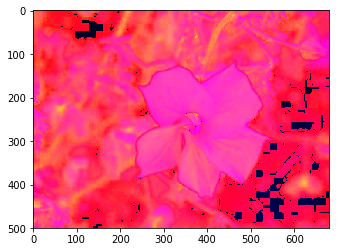

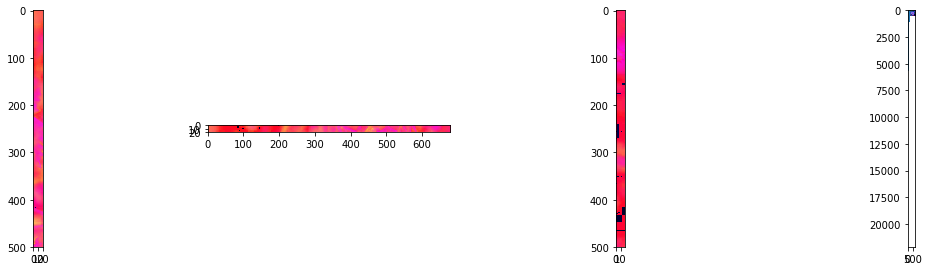

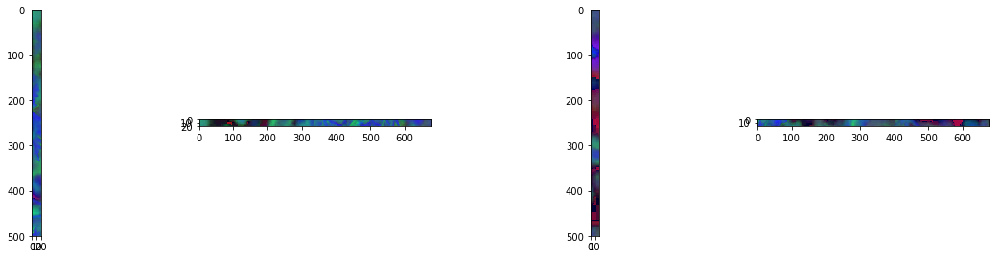

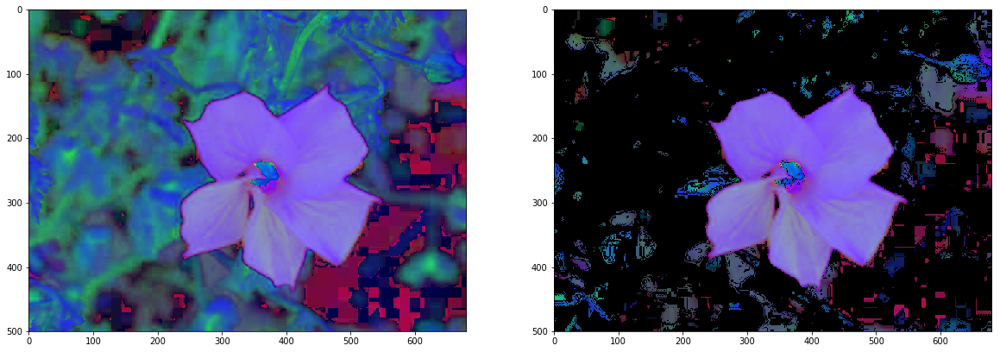

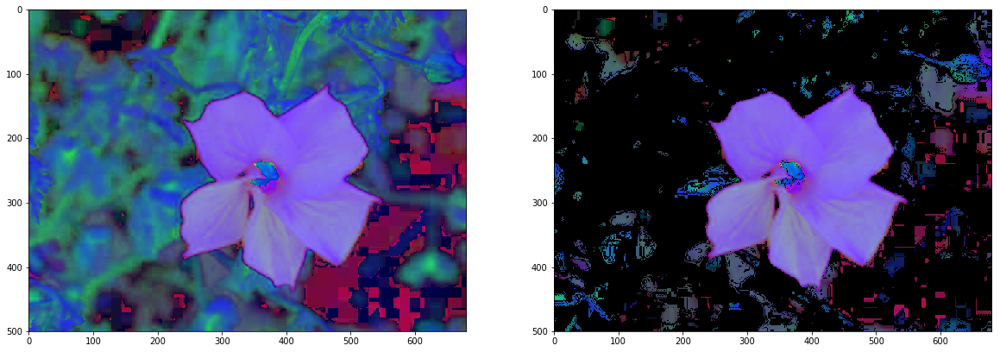

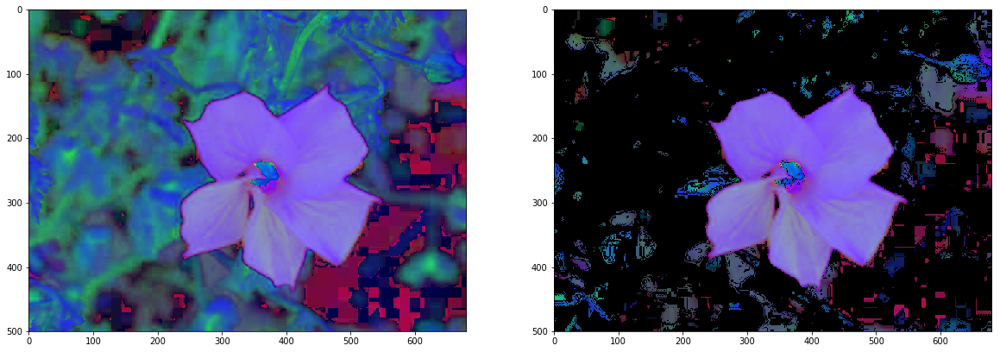

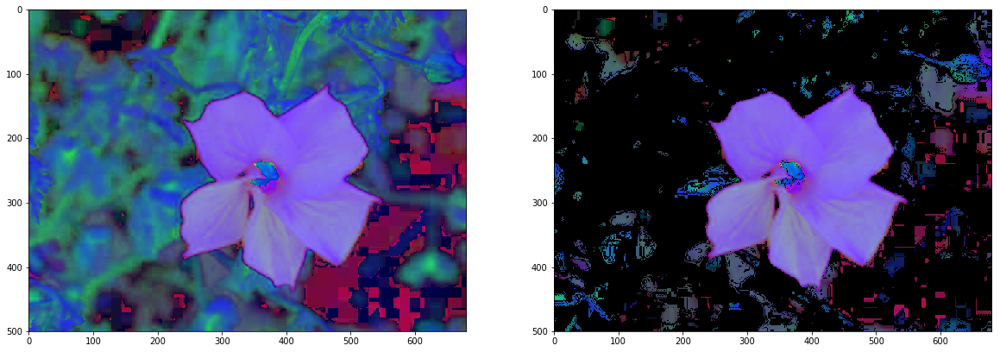

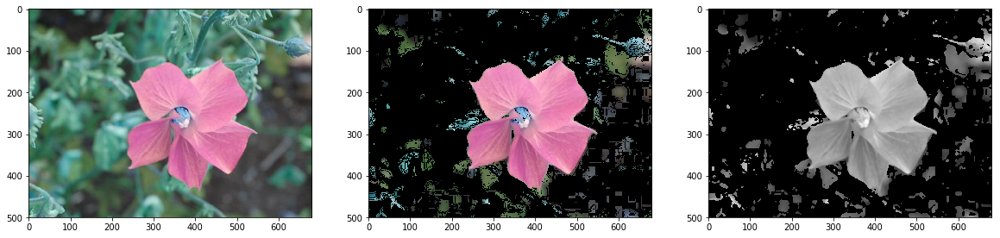

flower_category: 55
The Thresholded Image in Gray


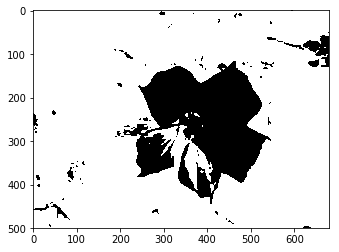

Petals count Algorithm started...
Number of Contours 106
Bounding Rect Width: 1, Height: 3
Bounding Rect Width: 7, Height: 7
Bounding Rect Width: 1, Height: 1
Bounding Rect Width: 5, Height: 4
Bounding Rect Width: 3, Height: 3
Bounding Rect Width: 680, Height: 500
Bounding Rect Width: 7, Height: 8
Bounding Rect Width: 7, Height: 5
Bounding Rect Width: 10, Height: 7
Bounding Rect Width: 5, Height: 6
Bounding Rect Width: 7, Height: 9
Bounding Rect Width: 12, Height: 12
Bounding Rect Width: 18, Height: 13
Bounding Rect Width: 7, Height: 4
Bounding Rect Width: 35, Height: 34
Bounding Rect Width: 7, Height: 5
Bounding Rect Width: 7, Height: 5
Bounding Rect Width: 5, Height: 3
Bounding Rect Width: 8, Height: 9
Bounding Rect Width: 4, Height: 4
Bounding Rect Width: 9, Height: 7
Bounding Rect Width: 5, Height: 6
Bounding Rect Width: 10, Height: 12
Bounding Rect Width: 5, Height: 4
Bounding Rect Width: 3, Height: 3
Bounding Rect Width: 20, Height: 25
Bounding Rect Width: 4, Height: 4
Bounding R

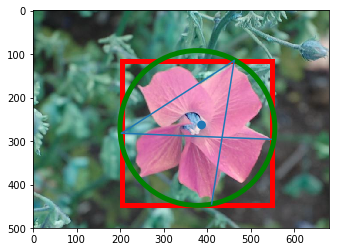

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 0,0,0  , HSI 0.0,0.0,0.0
[0, 0, 0, 60, 0, 59, 60]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


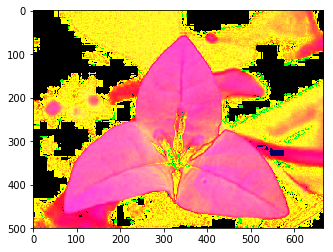

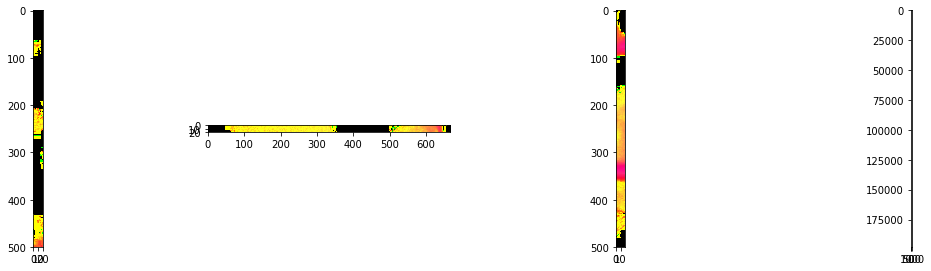

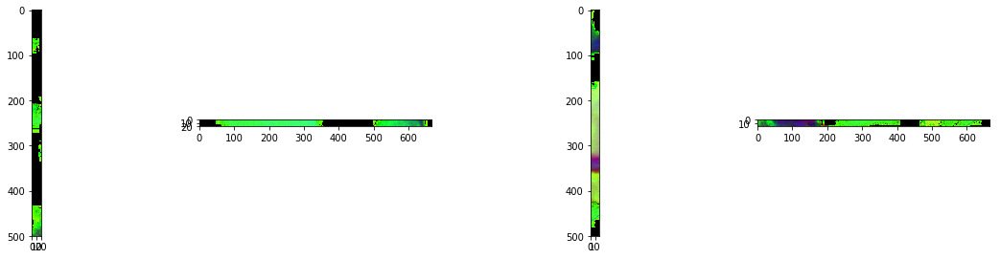

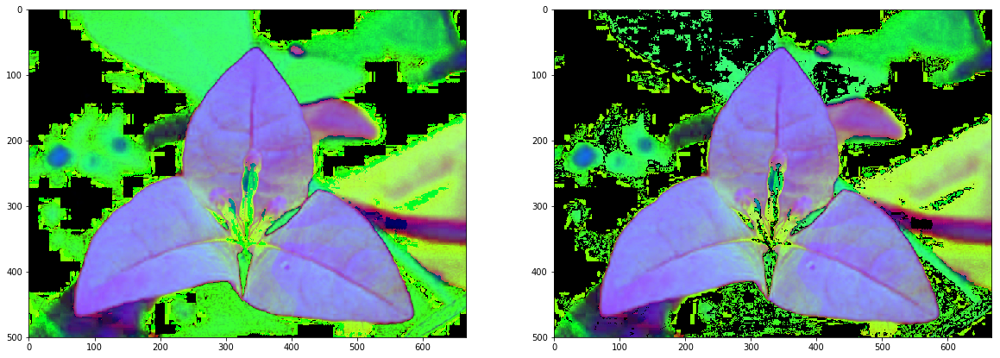

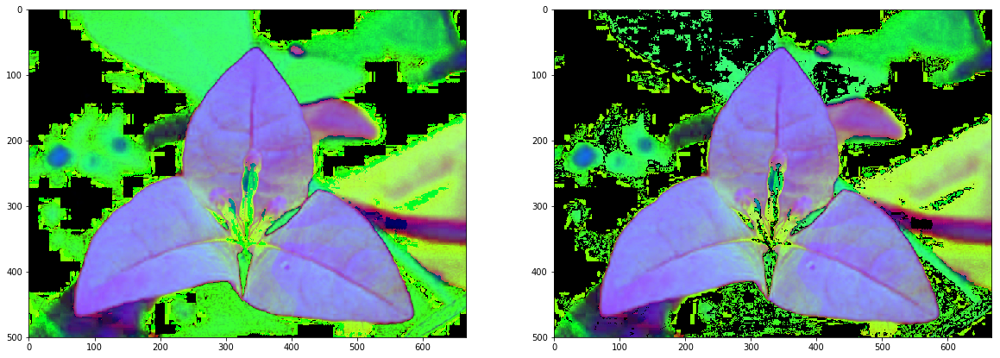

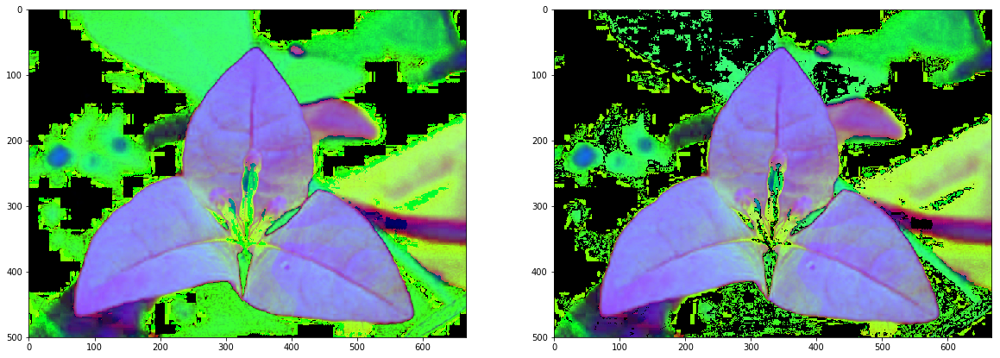

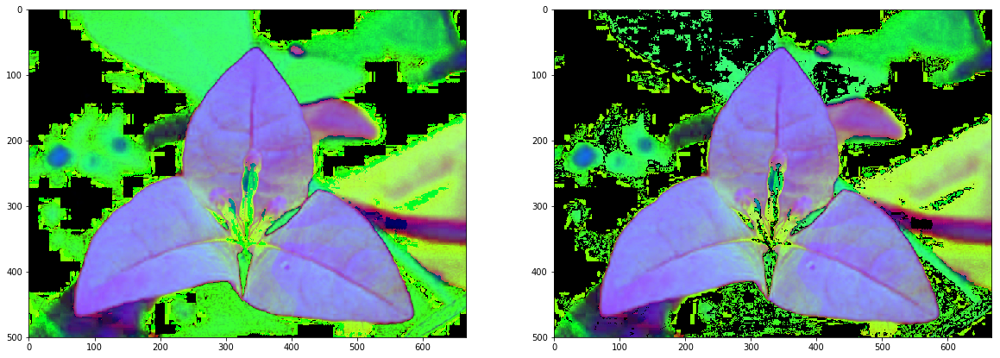

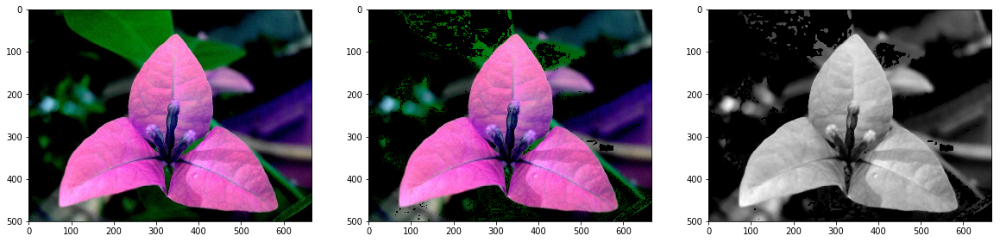

flower_category: 95
The Thresholded Image in Gray


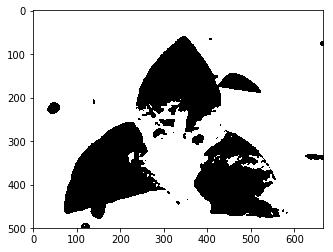

Petals count Algorithm started...
Number of Contours 54
Bounding Rect Width: 3, Height: 2
Bounding Rect Width: 667, Height: 500
Bounding Rect Width: 7, Height: 9
Bounding Rect Width: 8, Height: 9
Bounding Rect Width: 11, Height: 11
Bounding Rect Width: 5, Height: 5
Bounding Rect Width: 9, Height: 9
Bounding Rect Width: 3, Height: 4
Bounding Rect Width: 9, Height: 8
Bounding Rect Width: 8, Height: 11
Bounding Rect Width: 5, Height: 5
Bounding Rect Width: 3, Height: 3
Bounding Rect Width: 3, Height: 3
Bounding Rect Width: 5, Height: 4
Bounding Rect Width: 3, Height: 3
Bounding Rect Width: 31, Height: 28
Bounding Rect Width: 5, Height: 3
Bounding Rect Width: 10, Height: 16
Bounding Rect Width: 3, Height: 5
Bounding Rect Width: 3, Height: 3
Bounding Rect Width: 202, Height: 203
Bounding Rect Width: 5, Height: 6
Bounding Rect Width: 5, Height: 4
Bounding Rect Width: 2, Height: 1
Bounding Rect Width: 4, Height: 5
Bounding Rect Width: 2, Height: 3
Bounding Rect Width: 37, Height: 24
Bounding 

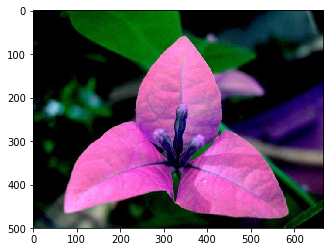

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 87,93,93  , HSI 180.0,0.04395604395604391,0.4080717488789237
[13, 16, 20, 24, 30, 35, 36, 38, 13, 15, 16, 19, 20, 24, 30, 34, 35, 36, 37, 38, 30, 34, 35, 36, 13, 15, 16, 19, 21, 24]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


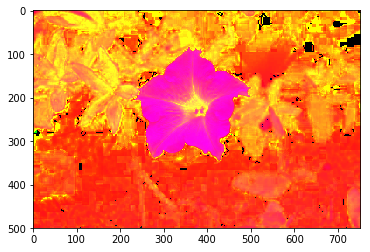

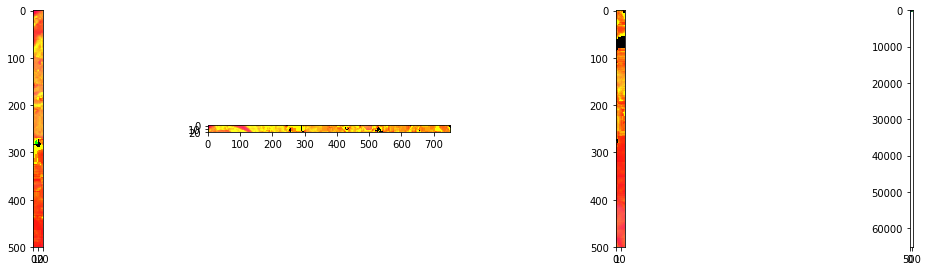

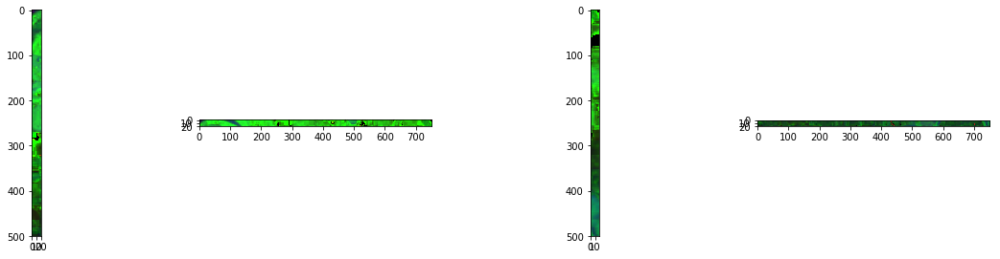

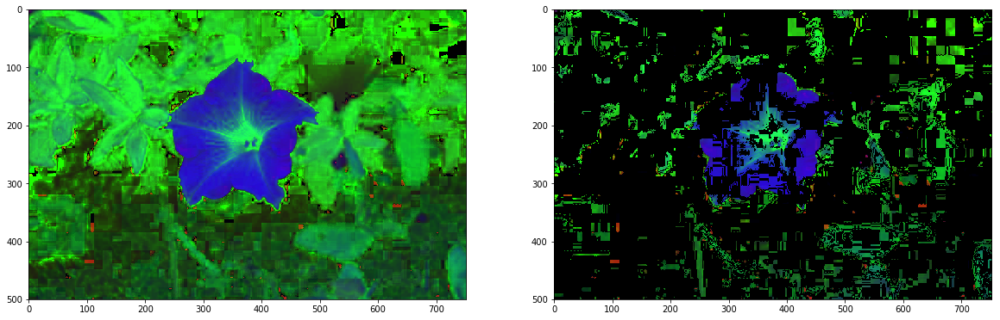

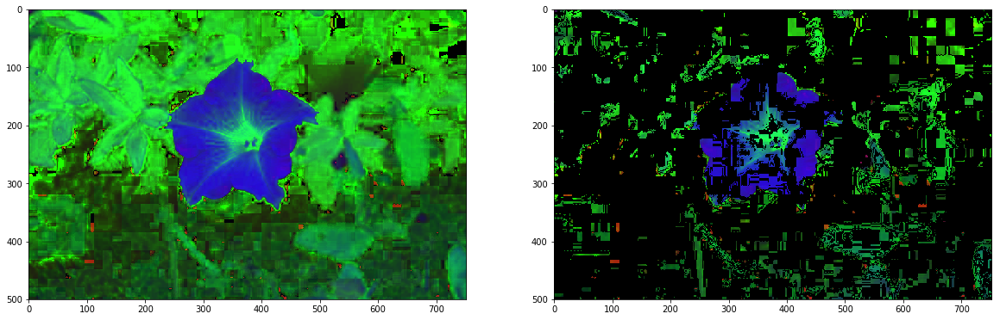

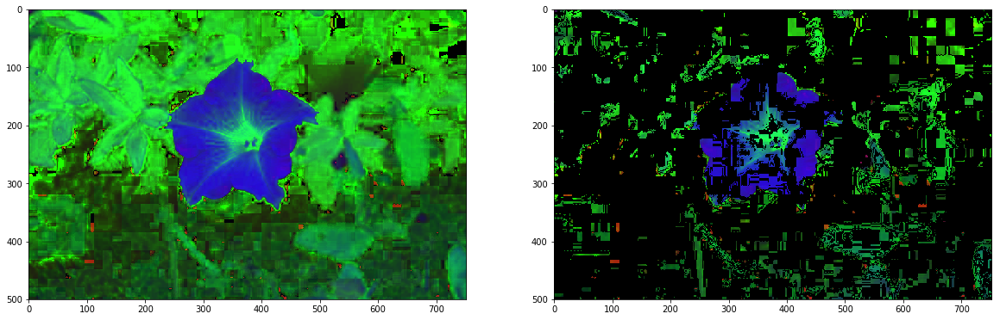

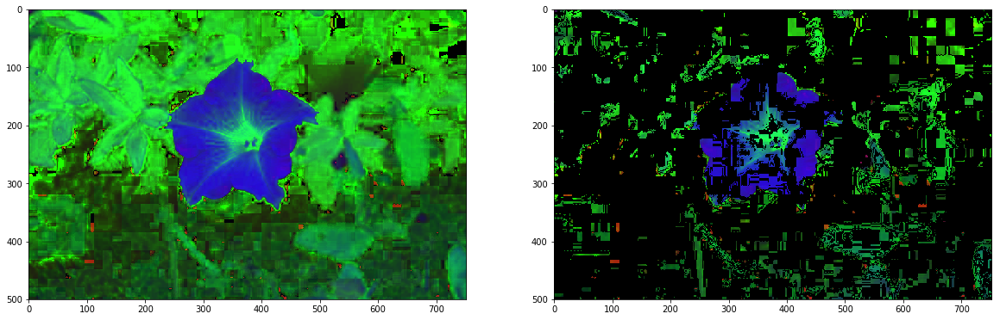

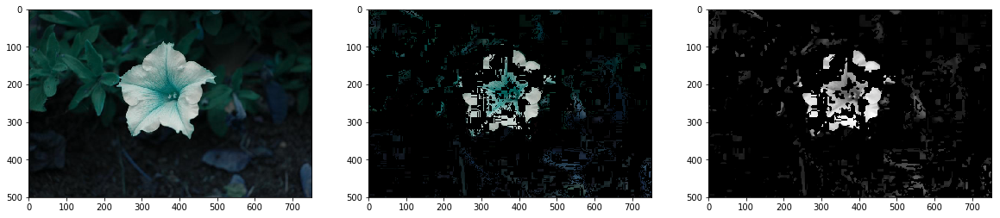

flower_category: 51
The Thresholded Image in Gray


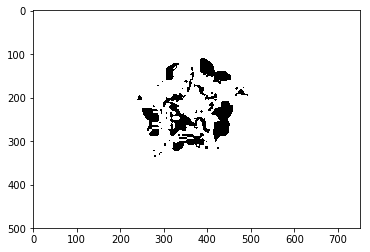

Petals count Algorithm started...
Number of Contours 56
Bounding Rect Width: 752, Height: 500
Bounding Rect Width: 6, Height: 8
Bounding Rect Width: 8, Height: 10
Bounding Rect Width: 3, Height: 3
Bounding Rect Width: 10, Height: 5
Bounding Rect Width: 7, Height: 6
Bounding Rect Width: 6, Height: 6
Bounding Rect Width: 9, Height: 12
Bounding Rect Width: 6, Height: 10
Bounding Rect Width: 3, Height: 3
Bounding Rect Width: 4, Height: 4
Bounding Rect Width: 7, Height: 5
Bounding Rect Width: 3, Height: 4
Bounding Rect Width: 21, Height: 14
Bounding Rect Width: 77, Height: 45
Bounding Rect Width: 1, Height: 3
Bounding Rect Width: 1, Height: 3
Bounding Rect Width: 1, Height: 3
Bounding Rect Width: 25, Height: 19
Bounding Rect Width: 9, Height: 5
Bounding Rect Width: 10, Height: 7
Bounding Rect Width: 6, Height: 4
Bounding Rect Width: 5, Height: 8
Bounding Rect Width: 5, Height: 5
Bounding Rect Width: 6, Height: 6
Bounding Rect Width: 7, Height: 8
Bounding Rect Width: 7, Height: 9
Bounding Re

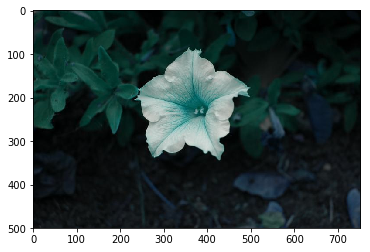

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 101,149,127  , HSI 152.75452038596444,0.1962864721485411,0.4928104575163399
[48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 35, 38, 43, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 40, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 30, 34, 35, 36, 42, 43, 48, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


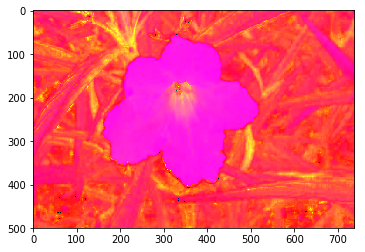

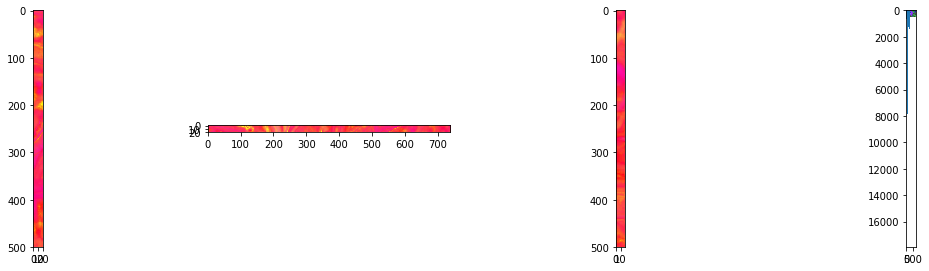

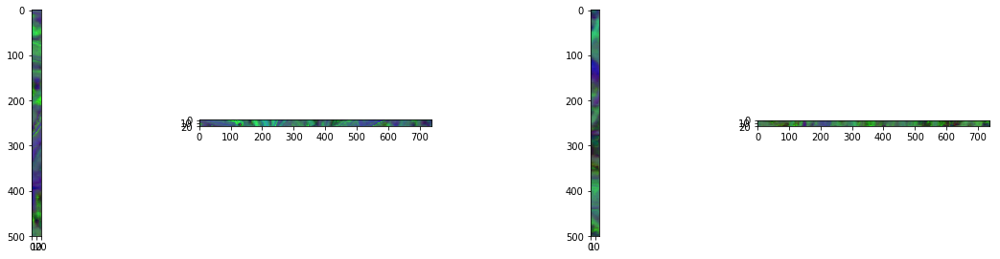

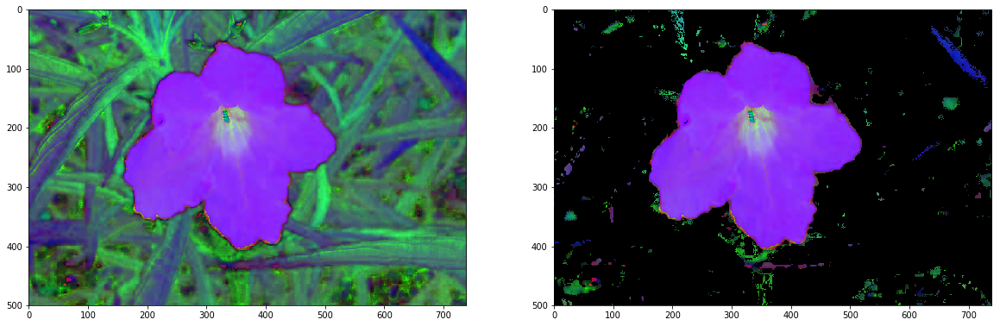

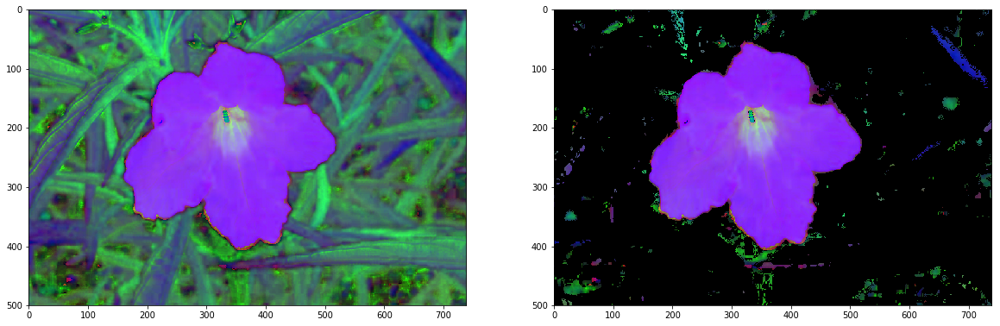

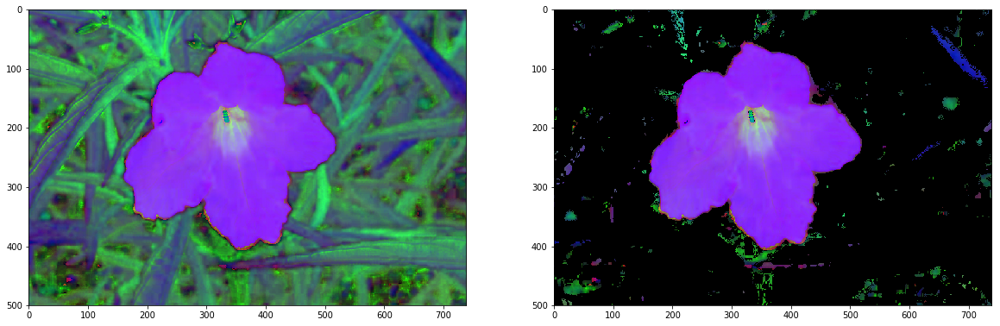

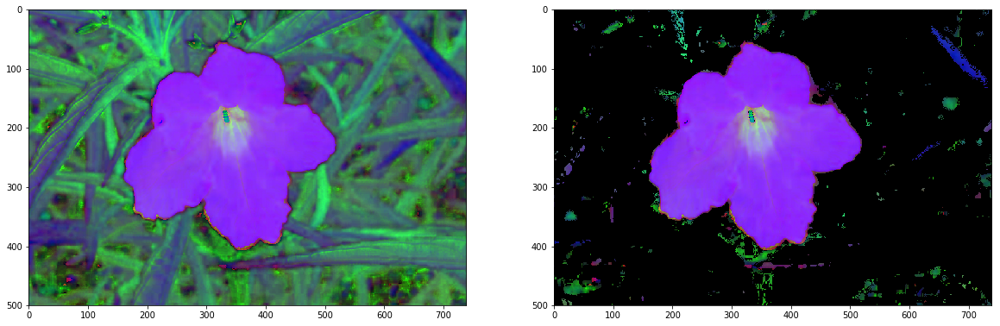

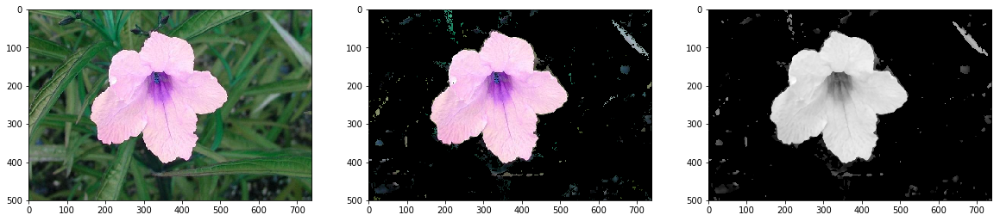

flower_category: 98
The Thresholded Image in Gray


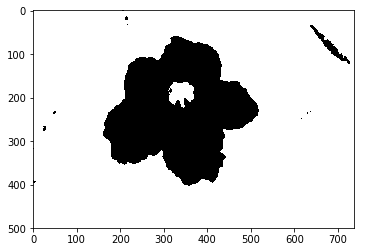

Petals count Algorithm started...
Number of Contours 14
Bounding Rect Width: 739, Height: 500
Bounding Rect Width: 11, Height: 17
Bounding Rect Width: 5, Height: 5
Bounding Rect Width: 6, Height: 6
Bounding Rect Width: 7, Height: 10
Bounding Rect Width: 6, Height: 4
Bounding Rect Width: 4, Height: 5
Bounding Rect Width: 359, Height: 346
Height 346, Width 359, Area 74736.0, extLeft: (160, 287), extRight: (518, 227), extTop: (324, 58), extBot: (360, 403), Line1: Line2D(),\             Line2: Line2D(), Line3: Line2D(), circle_area: 105208.79637606858, ellipse_area: 319366.845196671, rect_area: 124214
Side 1: 317.5059054568907, Side 2: 269.45314991664134, Side 3: 294.7626163542453
Value: 319366.845196671 Type: <class 'float'>
Triangle Area: 36538.017027339076, Chosen Area for petals count: Elliptical, Area: 319366.845196671, petals: 7
flower_name:  'mexican petunia'
Bounding Rect Width: 4, Height: 6
Bounding Rect Width: 58, Height: 60
Bounding Rect Width: 4, Height: 4
Bounding Rect Width: 

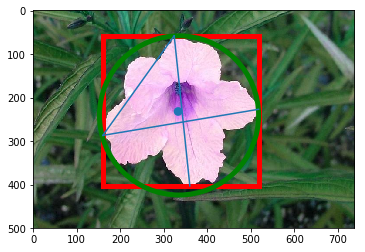

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 84,130,101  , HSI 141.434881662485,0.19999999999999984,0.41176470588235287
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 77, 80, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 80, 83, 112, 114, 116, 120, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 80, 81, 83, 84, 85, 89, 93, 94, 95, 96, 97, 98]
[0, 0, 0, 0]
[0, 0, 0, 0]


KeyboardInterrupt: 

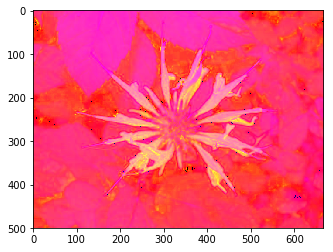

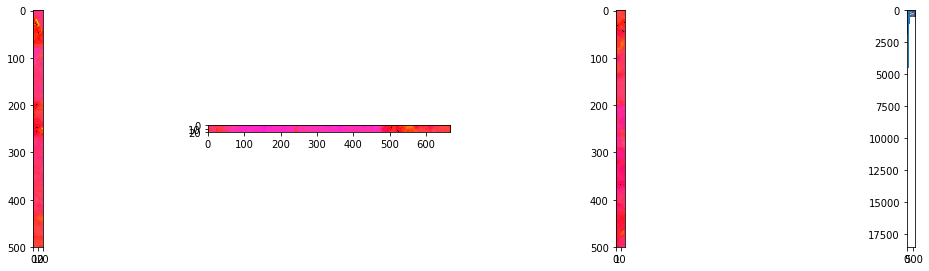

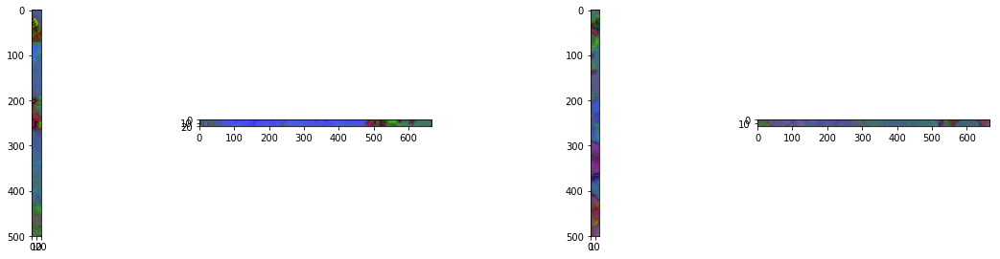

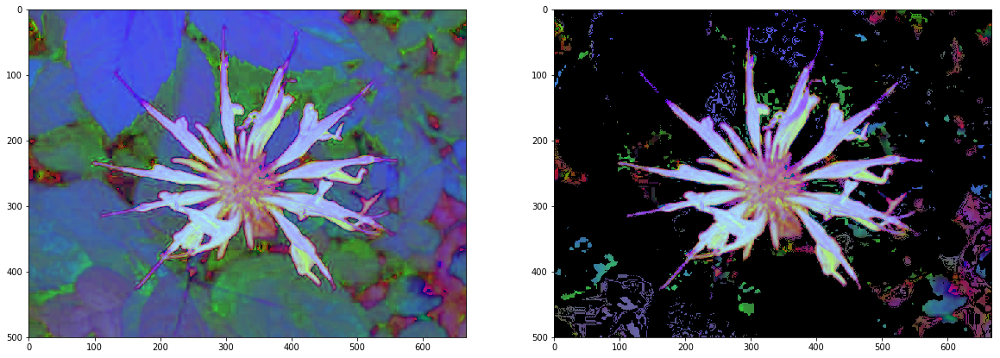

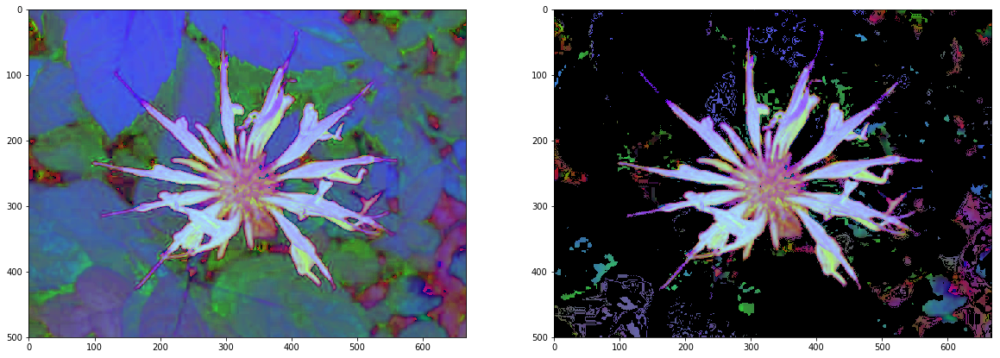

In [54]:
for k,v in petal_source_db.items():
    #print("k: {0}, v: {1}".format(k,v))
    img = cv2.imread(v, -1)
    plt.imshow(img)
    
    #BGR to HSI
    normalized_img = np.zeros(img.shape).astype(float)
    normalized_img = cv2.normalize(img.astype(float),normalized_img,0,1,cv2.NORM_MINMAX)
    img_converted = np.zeros_like(img,dtype='float')
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            H = 0
            S = 0
            I = 0
            R = float(normalized_img[i][j][2])
            G = float(normalized_img[i][j][1])
            B = float(normalized_img[i][j][0])
            RGB_sum = R + G + B
            RGB_min = min(R, G, B)
            #print("{} ,{} ,{} , {} , {}".format(R,G,B,RGB_min,RGB_sum))
            I = (1/3) * RGB_sum
            if R == G and G == B:
                H = 0
                S = 0
            else:
                S = 1 - ((3*RGB_min)/RGB_sum)
                if S > 0.9999:
                    S = 1
                if S < 0.00001:
                    S = 0
                    H = 0
                else:
                    dividend = (1/2) * ((R-G) + (R-B))
                    divisor = math.sqrt(math.pow((R-G),2) + (R-B)*(G-B))
                    w = dividend/divisor
                    if w > 1:
                        w=1
                    elif w < -1:
                        w = -1                    
                    H = math.acos(w)
                    if B > G:
                        H = (2*math.pi) - H
            img_converted[i][j][0] = H * (180 / math.pi)
            img_converted[i][j][1] = S
            img_converted[i][j][2] = I

    plt.imshow(img_converted)
    print("RGB {},{},{}  , HSI {},{},{}".format(img[0][0][2],img[0][0][1],img[0][0][0],img_converted[0][0][0]
                                               ,img_converted[0][0][1],img_converted[0][0][2]))
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(4,4,1)
    plt.imshow(img_converted[0:,0:20])
    ax = fig.add_subplot(4,4,2)
    plt.imshow(img_converted[0:20,0:])
    ax = fig.add_subplot(4,4,3)
    plt.imshow(img_converted[0:,-20:-1])
    ax = fig.add_subplot(4,4,4)
    plt.imshow(img_converted[-20:-1,0:])
    
    
    HSV_img = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
    plt.imshow(HSV_img)
    
    plt.hist(HSV_img.ravel(),256,[0,256])
    
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(4,4,1)
    plt.imshow(HSV_img[0:,0:20])
    ax = fig.add_subplot(4,4,2)
    plt.imshow(HSV_img[0:20,0:])
    ax = fig.add_subplot(4,4,3)
    plt.imshow(HSV_img[0:,-20:-1])
    ax = fig.add_subplot(4,4,4)
    plt.imshow(HSV_img[-20:-1,0:])
    
    filterd_HSV_filter = np.zeros_like(HSV_img)
    filterd_HSV_filter = cv2.normalize(HSV_img,filterd_HSV_filter,0,255,cv2.NORM_MINMAX)
    filter_size = 35
    for i in range(4):
        ratio = 4
        mask = np.zeros(HSV_img.shape[:2],np.uint8)
        mask[0:,0:filter_size] = 1
        mask[0:,-filter_size:-1] = 1
        mask[0:filter_size,0:] = 1
        mask[-filter_size:-1,0:] = 1
        filterd_HSV_filter = Remove_Freq_Values(filterd_HSV_filter,filter_size,ratio)
        #plt.imshow(filterd_HSV_filter_1)
        fig = plt.figure(figsize=(20,20))
        ax = fig.add_subplot(2,2,1)
        plt.imshow(HSV_img)
        ax = fig.add_subplot(2,2,2)
        plt.imshow(filterd_HSV_filter)
        filter_size += 5
        ratio += 4
    
    
    new_img = cv2.cvtColor(filterd_HSV_filter,cv2.COLOR_HSV2BGR)
    new_img2 = cv2.medianBlur(new_img,5)
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(1,3,1)
    plt.imshow(img)
    ax = fig.add_subplot(1,3,2)
    plt.imshow(new_img)
    ax = fig.add_subplot(1,3,3)
    plt.imshow(new_img2)
    
    gray = cv2.cvtColor(new_img2, cv2.COLOR_BGR2GRAY)
    plt.imshow(gray, cmap='gray')
    plt.show()

    #Get Flower category 
    pattern = '\\'
    truncated = v[v.rfind(pattern, 0, v.rfind(pattern)) + 1 : ]
    index2 = v[v.rfind(pattern, 0, v.rfind(pattern)) + 1 : ].rfind(pattern)
    flower_category = truncated[0: index2]
    print("flower_category: {0}".format(flower_category))
            
    
    if not cv2.imwrite(r'.\..\Storage\preview_filtered_flowers_for_petals' + "\\" + flower_category + "\\" + "gray.png", gray) :
        print("Unable to save in {0} due to internal problem".format(filtered_image_path + "\\" + "gray.png"))
        
    ret,thresh = cv2.threshold(gray,127,255,cv2.THRESH_BINARY_INV)
    
    print("The Thresholded Image in Gray")
    plt.imshow(thresh, cmap='gray')
    plt.show()
    
    print("Petals count Algorithm started...")
    cnts, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE , cv2.CHAIN_APPROX_SIMPLE)
    print("Number of Contours {0}".format(len(cnts)))

    # Create figure and axes
    fig,ax = plt.subplots(1)

    # Display the image
    ax.imshow(img)

    count = 1
    for c in cnts:
        # compute the bounding box of the contour and use the
        # bounding box to compute the aspect ratio

        #if count == 2:
        (x, y, w, h) = cv2.boundingRect(c)
        print("Bounding Rect Width: {0}, Height: {1}".format(w,h))
        if ((h > 300 and w > 300) and (h < img.shape[0] and w < img.shape[1])):
            
            contour_area = cv2.contourArea(c)
            rect_area = w * h


            rect = patches.Rectangle((x,y),w,h,linewidth=5,edgecolor='r',facecolor='none')
            ax.add_patch(rect)

            (min_cx,min_cy),radius = cv2.minEnclosingCircle(c)
            center = (int(min_cx),int(min_cy))
            radius = int(radius)
            circle = patches.Circle((min_cx, min_cy), radius=radius, linewidth=5, edgecolor='g',facecolor='none')
            ax.add_patch(circle)
            circle_area = math.pi * radius * radius

            (x, y), (MA, ma), angle = cv2.fitEllipse(c)
            ellipse_area = math.pi * MA * ma

            # determine the most extreme points along the contour
            extLeft = tuple(c[c[:, :, 0].argmin()][0])
            extRight = tuple(c[c[:, :, 0].argmax()][0])
            extTop = tuple(c[c[:, :, 1].argmin()][0])
            extBot = tuple(c[c[:, :, 1].argmax()][0])

            line1 = mlines.Line2D([extLeft[0],extRight[0]], [extLeft[1],extRight[1]])
            line2 = mlines.Line2D([extTop[0],extBot[0]], [extTop[1],extBot[1]])
            line3 = mlines.Line2D([extLeft[0], extTop[0]], [extLeft[1], extTop[1]])
            
            str_data = "Height {0}, Width {1}, Area {2}, extLeft: {3}, extRight: {4}, extTop: {5}, extBot: {6}, Line1: {7},\ \
            Line2: {8}, Line3: {9}, circle_area: {10}, ellipse_area: {11}, rect_area: {12}".format(h, w, \
            contour_area, extLeft, extRight, extTop, extBot, line1, line2, line3, circle_area, ellipse_area, rect_area)
            print(str_data)
            
            ax.add_line(line1)
            ax.add_line(line2)
            ax.add_line(line3)

            side1 = distance(extLeft[0],extRight[0], extLeft[1], extRight[1])
            side2 = distance(extTop[0],extBot[0], extTop[1], extBot[1])
            side3 = distance(extLeft[0], extTop[0], extLeft[1], extTop[1])
            str_side = "Side 1: {0}, Side 2: {1}, Side 3: {2}".format(side1, side2, side3)
            print(str_side)
            semi_perimeter = (side1 + side2 + side3)//2
            traingle_area = math.sqrt(semi_perimeter*(semi_perimeter-side1)*(semi_perimeter-side2)*(semi_perimeter-side3))

            M = cv2.moments(c)
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            center_circle = plt.Circle((cx, cy), 10)
            ax.add_patch(center_circle)

            list_areas = [rect_area, circle_area, ellipse_area]
            index, value = max(enumerate(list_areas), key=operator.itemgetter(1))
            print("Value: {0} Type: {1}".format(value, type(value)))
            area_selected = numbers_to_strings(index)
            
            #Number of petals
            petals = math.ceil((value*0.85)//traingle_area)
            print("Triangle Area: {0}, Chosen Area for petals count: {1}, Area: {2}, petals: {3}".format(traingle_area, \
                 area_selected, value, petals))
            
            
            #Get flower name
            flower_name = oxford102_labels.loc[int(flower_category)].get('Names')
            print("flower_name: {0}".format(flower_name))
            
            #open the csv file to save the flower category name and petals count
            with open('flowers_with_petals_info.csv', 'a', newline='') as file:
                writer = csv.writer(file)
                writer.writerow([flower_category, flower_name, petals])             
            
            
        count = count + 1
    
    print("Petal count Algorithm Ended.")
 
    #Save Petal counted image
    plt.savefig(r'.\..\Storage\preview_filtered_flowers_for_petals' + "\\" + flower_category + "\\" + k)

    plt.show()
    
    time.sleep(2)    

for k,v in petal_source_db.items():
    pattern = '\\'
    truncated = v[v.rfind(pattern, 0, v.rfind(pattern)) + 1 : ]
    index2 = v[v.rfind(pattern, 0, v.rfind(pattern)) + 1 : ].rfind(pattern)
    flower_category = truncated[0: index2]
    print(flower_category)
    flower_name = oxford102_labels.loc[int(flower_category)].get('Names')
    print("flower_name: {0}".format(flower_name))
    petals = 4
    with open('flowers_with_petals_info.csv', 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(["Category", "Name", "Petals"])
        writer.writerow([flower_category, flower_name, petals])
    break
    #flower_name = oxford102_labels.loc[77].get('Names')


df = pd.read_csv('flowers_with_petals_info.csv')
df.head()

In [52]:

#circle_area: 99538.22163633902, ellipse_area: 259512.188355292, rect_area: 114195
my_list = [99538.221, 259512.188, 114195]
index, value = max(enumerate(my_list), key=operator.itemgetter(1))
print(index)
print(value)
print(traingle_area)
petals = math.ceil((value*0.85)//traingle_area)
print(petals)

1
259512.188
42569.26337004882
5


In [30]:
area_selected = numbers_to_strings(1)

In [31]:
print(area_selected)

Circular
